# TorchGMM Plotting Function Comprehensive Demo

This notebook demonstrates all the features and parameters of the `plot_gmm` function in the TorchGMM library. We'll go through each parameter systematically to show how they affect the visualization.

## Overview of Parameters:

The `plot_gmm` function provides extensive control over GMM visualization through several parameter categories:

**Core Data Parameters**
- **`X`**: Input data points to plot (array-like, shape (n_samples, 2))
- **`gmm`**: Fitted GMM object with predict(), means_, covariances_, etc. (optional)

**Data Point Styling**
- **`show_points`** *(bool, default=True)*: Whether to display the data points
- **`point_size`** *(float, default=5)*: Size of individual data points
- **`point_alpha`** *(float, default=0.5)*: Transparency of points (0=invisible, 1=opaque)
- **`point_color`** *(str/array, default='auto')*: Point coloring strategy:
  - `'auto'`: Smart coloring based on available cluster info
  - `'black'`: All points in black
  - Colormap name: Use matplotlib colormap (e.g., 'viridis', 'plasma')
  - Single color: Use one color for all points (e.g., 'red', '#FF0000')
  - Array-like: Custom colors/values for each point

**Cluster Visualization**
- **`color_by_cluster`** *(bool, default=False)*: Enable cluster-based point coloring
- **`true_labels`** *(array-like, optional)*: Ground truth cluster labels for comparison
- **`match_labels_to_true`** *(bool, default=False)*: Remap predicted labels to match true labels using Hungarian algorithm
- **`cluster_colors`** *(str/list, default='turbo')*: Cluster color specification:
  - Matplotlib colormap name (e.g., 'turbo', 'viridis')
  - Single color for all clusters
  - List of specific colors (e.g., ['red', 'blue', 'green'])
- **`show_incorrect_predictions`** *(bool, default=False)*: Highlight correct (green) vs incorrect (red) predictions

**Continuous Coloring**
- **`log_probs`** *(array-like, optional)*: Continuous values for color mapping (e.g., log-probabilities)
- **`colormap`** *(str, default='viridis')*: Matplotlib colormap for continuous values
- **`colorbar_label`** *(str, default='Log Probability')*: Label for the colorbar

**Component Ellipses**
- **`show_ellipses`** *(bool, default=True)*: Display confidence ellipses for GMM components
- **`ellipse_std_devs`** *(list, default=[1, 2, 3])*: Standard deviation levels for ellipse boundaries
- **`ellipse_alpha`** *(float, default=0.5)*: Fill transparency of ellipses
- **`ellipse_colors`** *(str/list, default='auto')*: Ellipse color specification (same options as cluster_colors)
- **`ellipse_fill`** *(bool, default=True)*: Whether ellipses should be filled or outline-only
- **`ellipse_line_style`** *(str, default='dotted')*: Line style ('solid', 'dashed', 'dotted')
- **`ellipse_line_width`** *(float, default=2)*: Thickness of ellipse boundaries
- **`ellipse_line_color`** *(str, default='black')*: Color of ellipse boundary lines
- **`ellipse_line_alpha`** *(float, default=0.5)*: Transparency of ellipse boundaries

**Component Centers/Means**
- **`show_means`** *(bool, default=True)*: Display component center points
- **`mean_marker`** *(str, default='h')*: Marker style for means ('x', 'o', '*', 'h', etc.)
- **`mean_size`** *(float, default=25)*: Size of mean markers
- **`mean_color`** *(str, default='black')*: Color of mean markers

**Initial Means** (if available)
- **`show_initial_means`** *(bool, default=False)*: Show starting positions from initialization
- **`initial_mean_marker`** *(str, default='H')*: Marker style for initial means
- **`initial_mean_size`** *(float, default=25)*: Size of initial mean markers
- **`initial_mean_color`** *(str, default='red')*: Color of initial mean markers

**Weight-Based Scaling**
- **`scale_alpha_by_weight`** *(bool, default=False)*: Scale ellipse transparency by component weight
- **`scale_size_by_weight`** *(bool, default=False)*: Scale marker size by component weight

**Plot Styling & Layout**
- **`ax`** *(matplotlib.Axes, optional)*: Axes object to plot on (creates new if None)
- **`title`** *(str, default='GMM Visualization')*: Plot title
- **`xlabel`** *(str, default='Feature 1')*: X-axis label
- **`ylabel`** *(str, default='Feature 2')*: Y-axis label
- **`legend`** *(bool, default=True)*: Whether to show legend
- **`legend_labels`** *(list, optional)*: Custom labels for legend entries

In [1]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import os

os.chdir('../')

import tgmm

# reload the module to reflect recent changes
import importlib
importlib.reload(tgmm)

from tgmm import GaussianMixture, GMMInitializer, dynamic_figsize, plot_gmm

device = 'cuda' if torch.cuda.is_available() else 'cpu'
random_state = 42
np.random.seed(random_state)
torch.manual_seed(random_state)

if device == 'cuda':
    torch.cuda.manual_seed(random_state)
    print('CUDA version:', torch.version.cuda)
    print('Device:', torch.cuda.get_device_name(0))
else:
    print('Using CPU')

Using CPU


In [2]:
n_samples = [800, 200, 1000, 1000]
centers = [np.array([0, 2]),
           np.array([2, -2]),
           np.array([0, 0]),
           np.array([2, 2])]
covs = [
    1.0 * np.eye(2),                    # spherical covariance
    0.5 * np.eye(2),                    # spherical covariance, fewer points
    np.array([[2, 0], [0, 0.5]]),       # diagonal covariance
    np.array([[0.2, 0.5], [0.5, 2]])    # full covariance
]

components = []
for n, center, cov in zip(n_samples, centers, covs):
    samples = np.dot(np.random.randn(n, 2), cov) + center
    components.append(samples)

X = np.vstack(components)
labels = np.concatenate([i * np.ones(n) for i, n in enumerate(n_samples)])
legend_labels = [f'Component {i+1}' for i in range(len(n_samples))]

n_features = X.shape[1]
n_components = len(n_samples)

# Convert to tensor (if needed for further processing)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
X_tensor = torch.tensor(X, dtype=torch.float32, device=device)

n_components = 4

# Initialize the GMM
gmm = GaussianMixture(
    n_components=n_components,
    covariance_type='full',
    tol=1e-6,
    reg_covar=1e-10,
    max_iter=1000,
    init_means='random',
    init_covariances='eye',
    n_init = 5,
    random_state=None,
    warm_start=False,
    verbose=False,
    verbose_interval=100,
    device='cpu',
)
# Fit the GMM
gmm.fit(X_tensor)

# Get predictions
y_pred = gmm.predict(X_tensor)

# Compute per-sample log-likelihoods
log_probs = gmm.score_samples(X_tensor)

# Get probabilities for each sample for each component
probs = gmm.predict_proba(X_tensor)
probs = probs.detach()

# Generate new samples
n_samples_to_generate = len(X)
gmm_samples, gmm_labels = gmm.sample(n_samples_to_generate)
gmm_samples = gmm_samples.detach().cpu().numpy()
gmm_labels = gmm_labels.detach().cpu().numpy()

# Compute probabilities for each generated sample
generated_probs = gmm.predict_proba(torch.tensor(gmm_samples, dtype=torch.float32).to(device))
generated_probs = generated_probs.detach().cpu().numpy()

## Default Parameters

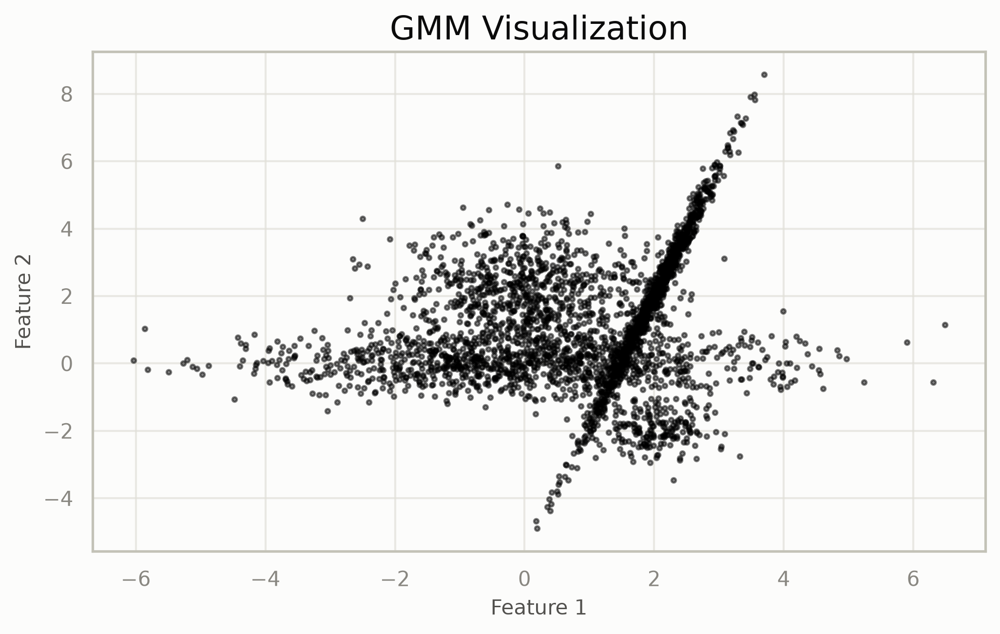

In [3]:
nrows, ncols = 1, 1
figsize = dynamic_figsize(nrows, ncols)
fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)

plot_gmm(
    X,
    gmm=None,

    # Data point styling
    show_points=True,
    point_size=5,
    point_alpha=0.5,
    point_color='auto',  # 'auto', 'black', array-like, or colormap name
    
    # Cluster visualization
    color_by_cluster=False,
    true_labels=None,
    match_labels_to_true=False,
    cluster_colors='turbo',  # Can be colormap name, single color, or list of colors
    show_incorrect_predictions=False,  # replaces 'outliers' mode
    
    # Continuous coloring (replaces 'continuous' mode)
    log_probs=None,
    colormap='viridis',
    colorbar_label='Log Probability',
    
    # Component ellipses
    show_ellipses=True,
    ellipse_std_devs=[1, 2, 3],  # List of standard deviations to show
    ellipse_alpha=0.5,
    ellipse_colors='auto',  # 'auto' uses same as clusters
    ellipse_fill=True,
    ellipse_line_style='dotted',
    ellipse_line_width=2,
    ellipse_line_color='black',
    ellipse_line_alpha=0.5,
    
    # Component centers/means
    show_means=True,
    mean_marker='h',
    mean_size=25,
    mean_color='black',
    
    # Initial means (if provided)
    show_initial_means=False,
    initial_mean_marker='H',
    initial_mean_size=25,
    initial_mean_color='red',
    
    # Weight visualization
    scale_alpha_by_weight=False,
    scale_size_by_weight=False,
    
    # Plot styling
    ax=ax,
    title='GMM Visualization',
    xlabel='Feature 1',
    ylabel='Feature 2',
    legend=True,
    legend_labels=None,
)

plt.tight_layout() 
plt.show()

## Simple Data Points Without GMM

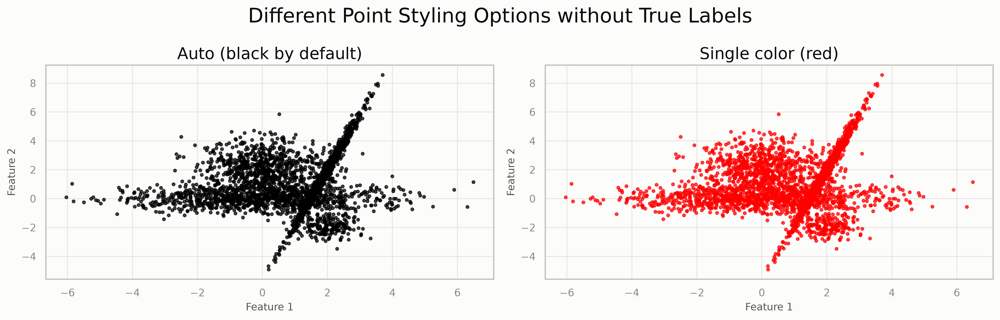

In [4]:
nrows, ncols = 1, 2
figsize = dynamic_figsize(nrows, ncols)
fig, axes = plt.subplots(nrows, ncols, figsize=figsize)
axes = axes.flatten()
fig.suptitle('Different Point Styling Options without True Labels')

# Different point colors
point_color_options = [
    ('auto', 'Auto (black by default)', {}),
    ('red', 'Single color (red)', {}),
]

for i, (color_option, title, extra_params) in enumerate(point_color_options):
    plot_gmm(
        X,
        gmm=None,
        point_color=color_option,
        point_size=8,
        point_alpha=0.7,
        title=title,
        show_ellipses=False,
        show_means=False,
        ax=axes[i],
        **extra_params
    )

plt.tight_layout()
plt.show()

## Cluster Coloring with True Labels

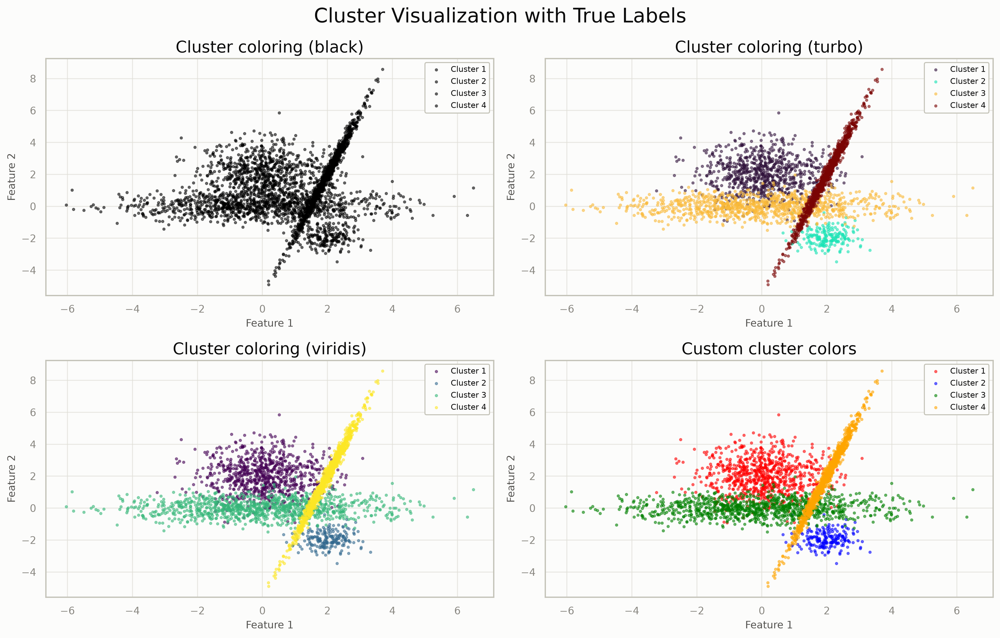

In [5]:
nrows, ncols = 2, 2
figsize = dynamic_figsize(nrows, ncols)
fig, axes = plt.subplots(nrows, ncols, figsize=figsize)
axes = axes.flatten()
fig.suptitle('Cluster Visualization with True Labels')

cluster_options = [
    (True, 'black', 'Cluster coloring (black)'),
    (True, 'turbo', 'Cluster coloring (turbo)'),
    (True, 'viridis', 'Cluster coloring (viridis)'),
    (True, ['red', 'blue', 'green', 'orange'], 'Custom cluster colors'),
]

for i, (color_by_cluster, cluster_colors, title) in enumerate(cluster_options):
    plot_gmm(
        X,
        gmm=None,
        color_by_cluster=color_by_cluster,
        true_labels=labels,
        cluster_colors=cluster_colors,
        title=title,
        show_ellipses=False,
        show_means=False,
        ax=axes[i]
    )

plt.tight_layout()
plt.show()

## Confidence Ellipses

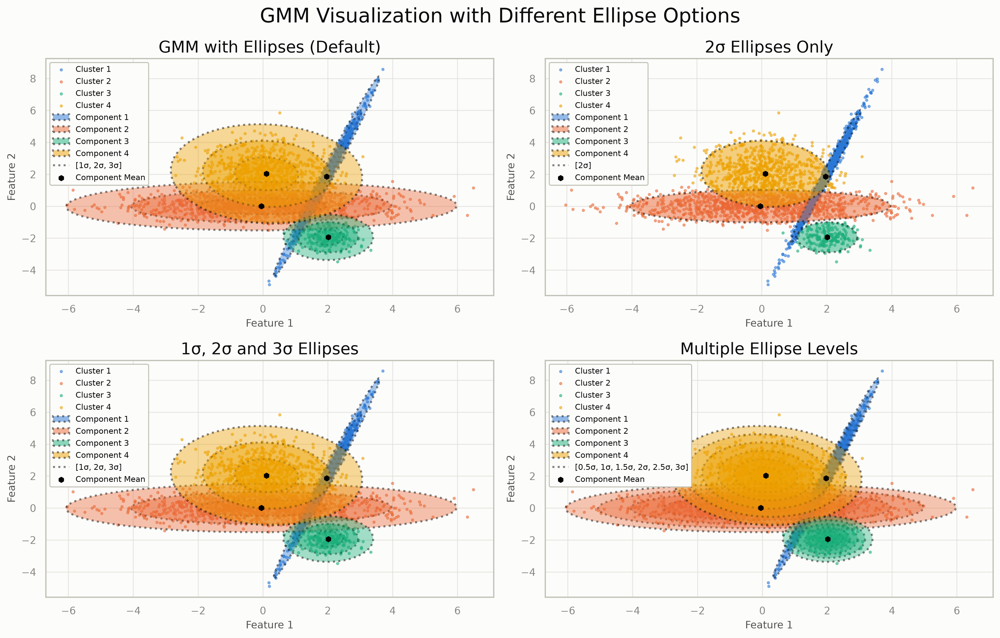

In [6]:
nrows, ncols = 2, 2
figsize = dynamic_figsize(nrows, ncols)
fig, axes = plt.subplots(nrows, ncols, figsize=figsize)
axes = axes.flatten()
fig.suptitle('GMM Visualization with Different Ellipse Options')

# Basic GMM with ellipses
plot_gmm(
    X,
    gmm=gmm,
    color_by_cluster=True,
    title='GMM with Ellipses (Default)',
    ax=axes[0]
)

# Different ellipse standard deviations
plot_gmm(
    X,
    gmm=gmm,
    color_by_cluster=True,
    ellipse_std_devs=[2],
    title='2σ Ellipses Only',
    ax=axes[1]
)

plot_gmm(
    X,
    gmm=gmm,
    color_by_cluster=True,
    ellipse_std_devs=[1, 2, 3],
    title='1σ, 2σ and 3σ Ellipses',
    ax=axes[2]
)

plot_gmm(
    X,
    gmm=gmm,
    color_by_cluster=True,
    ellipse_std_devs=[0.5, 1, 1.5, 2, 2.5, 3],
    title='Multiple Ellipse Levels',
    ax=axes[3]
)

plt.tight_layout()
plt.show()

## Ellipse Styling Options

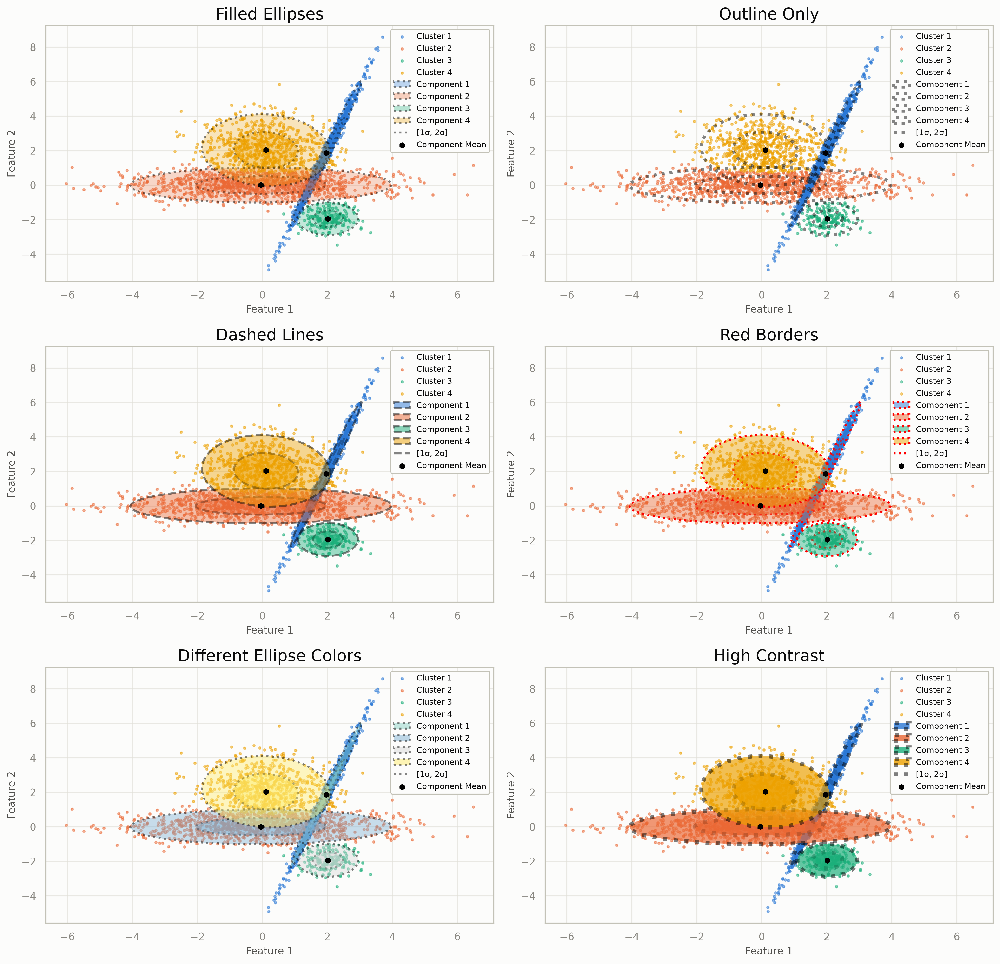

In [7]:
nrows, ncols = 3, 2
figsize = dynamic_figsize(nrows, ncols)
fig, axes = plt.subplots(nrows, ncols, figsize=figsize)
axes = axes.flatten()

# Different ellipse styling options
ellipse_styles = [
    {'ellipse_fill': True, 'ellipse_alpha': 0.3, 'title': 'Filled Ellipses'},
    {'ellipse_fill': False, 'ellipse_line_width': 3, 'title': 'Outline Only'},
    {'ellipse_line_style': 'dashed', 'ellipse_line_width': 2, 'title': 'Dashed Lines'},
    {'ellipse_line_color': 'red', 'ellipse_line_alpha': 1.0, 'title': 'Red Borders'},
    {'ellipse_colors': 'Set3', 'title': 'Different Ellipse Colors'},
    {'ellipse_alpha': 0.8, 'ellipse_line_width': 4, 'ellipse_line_color': 'black', 'title': 'High Contrast'}
]

for i, style_options in enumerate(ellipse_styles):
    title = style_options.pop('title')
    plot_gmm(
        X,
        gmm=gmm,
        color_by_cluster=True,
        ellipse_std_devs=[1, 2],
        title=title,
        ax=axes[i],
        **style_options
    )

plt.tight_layout()
plt.show()

## Log Probability Visualization

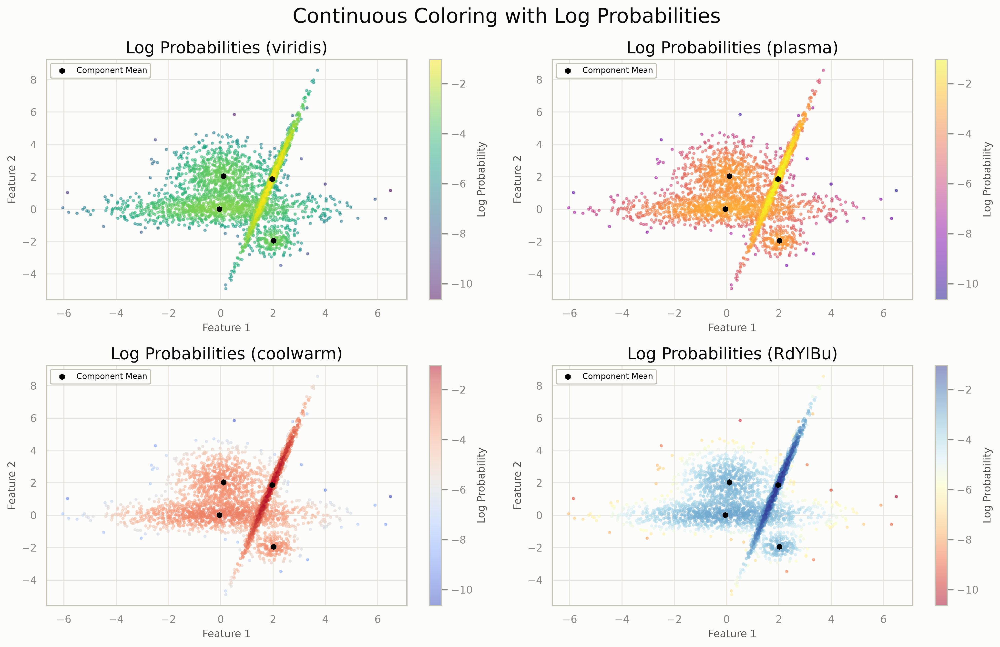

In [8]:
nrows, ncols = 2, 2
figsize = dynamic_figsize(nrows, ncols)
fig, axes = plt.subplots(nrows, ncols, figsize=figsize)
axes = axes.flatten()
fig.suptitle('Continuous Coloring with Log Probabilities')

# Different continuous coloring options
colormaps = ['viridis', 'plasma', 'coolwarm', 'RdYlBu']

for i, cmap in enumerate(colormaps):
    plot_gmm(
        X,
        gmm=gmm,
        log_probs=log_probs,
        colormap=cmap,
        colorbar_label='Log Probability',
        title=f'Log Probabilities ({cmap})',
        show_ellipses=False,
        ax=axes[i]
    )

plt.tight_layout()
plt.show()

## Mean Markers and Initial Means

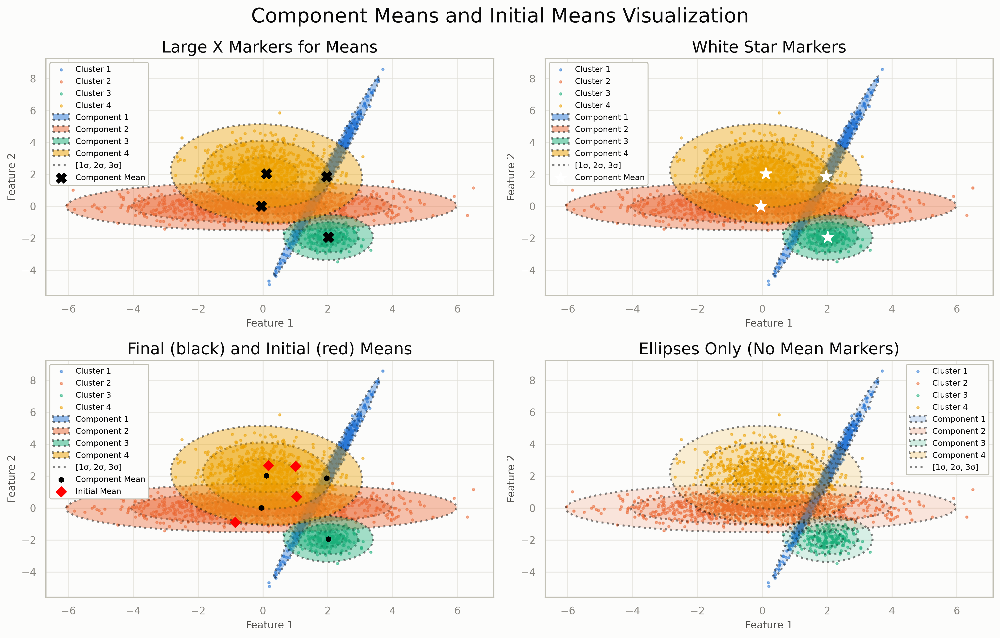

In [9]:
nrows, ncols = 2, 2
figsize = dynamic_figsize(nrows, ncols)
fig, axes = plt.subplots(nrows, ncols, figsize=figsize)
axes = axes.flatten()
fig.suptitle('Component Means and Initial Means Visualization')

# Different mean marker options
plot_gmm(
    X,
    gmm=gmm,
    color_by_cluster=True,
    show_means=True,
    mean_marker='X',
    mean_size=100,
    mean_color='black',
    title='Large X Markers for Means',
    ax=axes[0]
)

plot_gmm(
    X,
    gmm=gmm,
    color_by_cluster=True,
    show_means=True,
    mean_marker='*',
    mean_size=150,
    mean_color='white',
    title='White Star Markers',
    ax=axes[1]
)

# Show initial means if available
plot_gmm(
    X,
    gmm=gmm,
    color_by_cluster=True,
    show_means=True,
    show_initial_means=True,
    initial_mean_marker='D',
    initial_mean_size=50,
    initial_mean_color='red',
    title='Final (black) and Initial (red) Means',
    ax=axes[2]
)

plot_gmm(
    X,
    gmm=gmm,
    color_by_cluster=True,
    show_means=False,
    show_ellipses=True,
    ellipse_alpha=0.2,
    title='Ellipses Only (No Mean Markers)',
    ax=axes[3]
)

plt.tight_layout()
plt.show()

## Component Weight Visualization

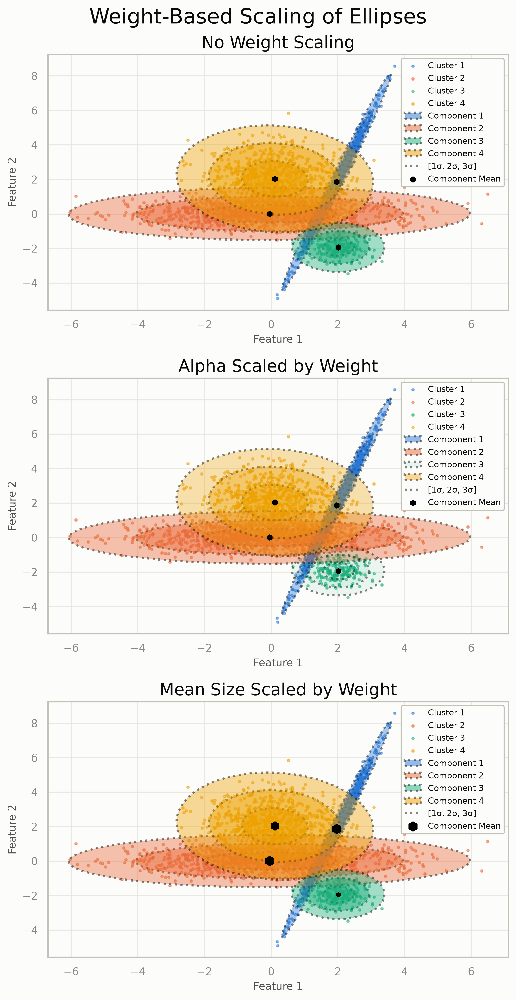

Component weights: [0.33035064 0.33636522 0.06536127 0.26792288]


In [10]:
nrows, ncols = 3, 1
figsize = dynamic_figsize(nrows, ncols)
fig, axes = plt.subplots(nrows, ncols, figsize=figsize)
axes = axes.flatten()
fig.suptitle('Weight-Based Scaling of Ellipses')

# Regular visualization
plot_gmm(
    X,
    gmm=gmm,
    color_by_cluster=True,
    title='No Weight Scaling',
    ax=axes[0]
)

# Scale alpha by weight
plot_gmm(
    X,
    gmm=gmm,
    color_by_cluster=True,
    scale_alpha_by_weight=True,
    title='Alpha Scaled by Weight',
    ax=axes[1]
)

# Scale size by weight
plot_gmm(
    X,
    gmm=gmm,
    color_by_cluster=True,
    scale_size_by_weight=True,
    title='Mean Size Scaled by Weight',
    ax=axes[2],
    mean_size=80,
)

plt.tight_layout()
plt.show()

# Print component weights for reference
print(f"Component weights: {gmm.weights_.detach().cpu().numpy()}")

## Prediction Accuracy Assessment

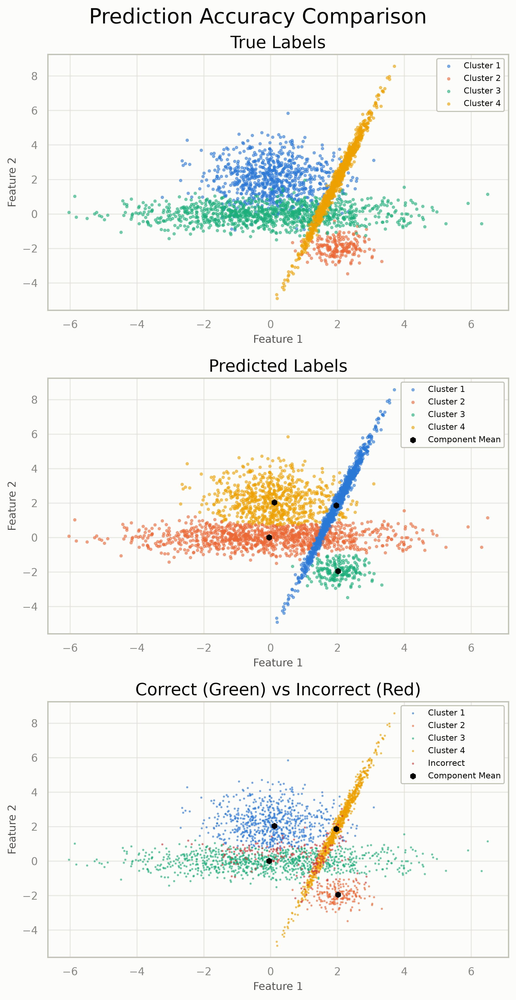

In [11]:
nrows, ncols = 3, 1
figsize = dynamic_figsize(nrows, ncols)
fig, axes = plt.subplots(nrows, ncols, figsize=figsize)
axes = axes.flatten()
fig.suptitle('Prediction Accuracy Comparison')

# Show true labels
plot_gmm(
    X,
    gmm=None,
    color_by_cluster=True,
    true_labels=labels,
    title='True Labels',
    show_ellipses=False,
    ax=axes[0]
)

# Show predicted labels
plot_gmm(
    X,
    gmm=gmm,
    color_by_cluster=True,
    title='Predicted Labels',
    show_ellipses=False,
    ax=axes[1]
)

# Show correct vs incorrect predictions
plot_gmm(
    X,
    gmm=gmm,
    true_labels=labels,
    show_incorrect_predictions=True,
    match_labels_to_true=True,
    title='Correct (Green) vs Incorrect (Red)',
    show_ellipses=False,
    ax=axes[2]
)

plt.tight_layout()
plt.show()

## Overview of Different Visualization Combinations

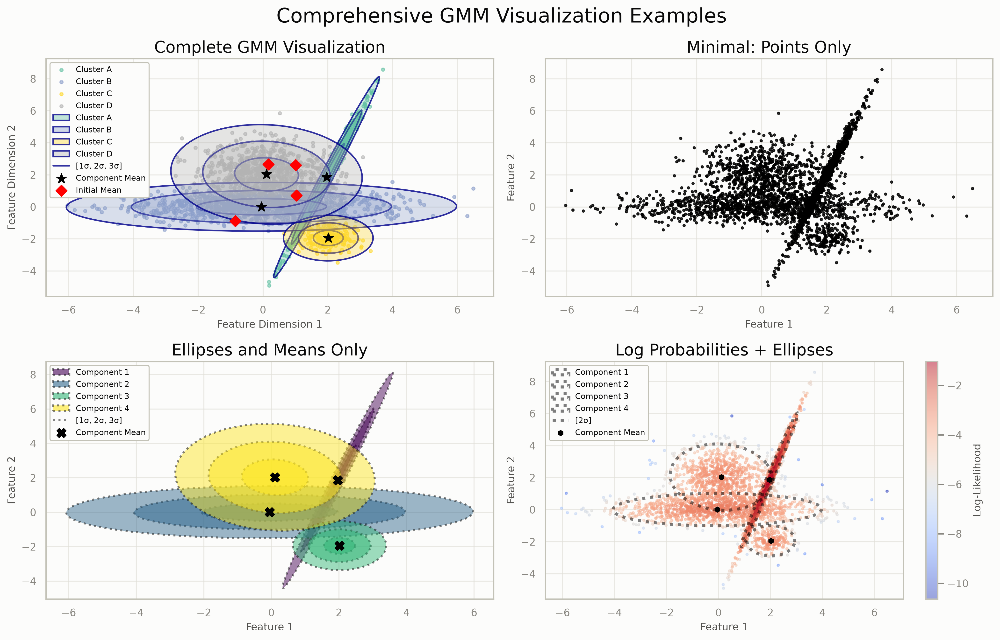

In [12]:
nrows, ncols = 2, 2
figsize = dynamic_figsize(nrows, ncols)
fig, axes = plt.subplots(nrows, ncols, figsize=figsize)
axes = axes.flatten()
fig.suptitle('Comprehensive GMM Visualization Examples')

# Custom legend labels
custom_labels = ['Cluster A', 'Cluster B', 'Cluster C', 'Cluster D']

# Full-featured visualization
plot_gmm(
    X,
    gmm=gmm,
    
    # Data points
    show_points=True,
    point_size=10,
    point_alpha=0.6,
    point_color='auto',
    
    # Clustering
    color_by_cluster=True,
    cluster_colors='Set2',
    legend_labels=custom_labels,
    
    # Ellipses
    show_ellipses=True,
    ellipse_std_devs=[1, 2, 3],
    ellipse_alpha=0.4,
    ellipse_fill=True,
    ellipse_line_style='solid',
    ellipse_line_width=1.5,
    ellipse_line_color='darkblue',
    ellipse_line_alpha=0.8,
    
    # Means
    show_means=True,
    mean_marker='*',
    mean_size=100,
    mean_color='black',
    
    # Initial means
    show_initial_means=True,
    initial_mean_marker='D',
    initial_mean_size=60,
    initial_mean_color='red',
    
    # Styling
    title='Complete GMM Visualization',
    xlabel='Feature Dimension 1',
    ylabel='Feature Dimension 2',
    ax=axes[0]
)

# Minimal visualization
plot_gmm(
    X,
    gmm=gmm,
    show_points=True,
    point_size=5,
    point_alpha=0.8,
    point_color='black',
    show_ellipses=False,
    show_means=False,
    legend=False,
    title='Minimal: Points Only',
    ax=axes[1]
)

# Ellipses only
plot_gmm(
    X,
    gmm=gmm,
    show_points=False,
    show_ellipses=True,
    ellipse_std_devs=[1, 2, 3],
    ellipse_alpha=0.6,
    ellipse_colors='viridis',
    show_means=True,
    mean_marker='X',
    mean_size=80,
    title='Ellipses and Means Only',
    ax=axes[2]
)

# Continuous coloring with ellipses
plot_gmm(
    X,
    gmm=gmm,
    log_probs=log_probs,
    colormap='coolwarm',
    colorbar_label='Log-Likelihood',
    show_ellipses=True,
    ellipse_std_devs=[2],
    ellipse_fill=False,
    ellipse_line_width=3,
    ellipse_line_color='black',
    title='Log Probabilities + Ellipses',
    ax=axes[3]
)

plt.tight_layout()
plt.show()